In [37]:
# This Python 3 environment comes with many helpful analytics libraries installed
# It is defined by the kaggle/python Docker image: https://github.com/kaggle/docker-python
# For example, here's several helpful packages to load

import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)

# Input data files are available in the read-only "../input/" directory
# For example, running this (by clicking run or pressing Shift+Enter) will list all files under the input directory

import os
for dirname, _, filenames in os.walk('/kaggle/input'):
    for filename in filenames:
      print(os.path.join(dirname, filename))

# You can write up to 20GB to the current directory (/kaggle/working/) that gets preserved as output when you create a version using "Save & Run All" 
# You can also write temporary files to /kaggle/temp/, but they won't be saved outside of the current session

# Use the kagglehub client library to attach Kaggle resources like competitions, datasets, and models to your session
# Learn more about kagglehub: https://github.com/Kaggle/kagglehub/blob/main/README.md

import kagglehub
#dataset=kagglehub.dataset_download('/kaggle/input/datasets/puneet6060/intel-image-classification/seg_train')

/kaggle/input/datasets/puneet6060/intel-image-classification/seg_train/seg_train/mountain/14986.jpg
/kaggle/input/datasets/puneet6060/intel-image-classification/seg_train/seg_train/mountain/3138.jpg
/kaggle/input/datasets/puneet6060/intel-image-classification/seg_train/seg_train/mountain/1700.jpg
/kaggle/input/datasets/puneet6060/intel-image-classification/seg_train/seg_train/mountain/16257.jpg
/kaggle/input/datasets/puneet6060/intel-image-classification/seg_train/seg_train/mountain/2863.jpg
/kaggle/input/datasets/puneet6060/intel-image-classification/seg_train/seg_train/mountain/771.jpg
/kaggle/input/datasets/puneet6060/intel-image-classification/seg_train/seg_train/mountain/12167.jpg
/kaggle/input/datasets/puneet6060/intel-image-classification/seg_train/seg_train/mountain/17643.jpg
/kaggle/input/datasets/puneet6060/intel-image-classification/seg_train/seg_train/mountain/6560.jpg
/kaggle/input/datasets/puneet6060/intel-image-classification/seg_train/seg_train/mountain/10162.jpg
/kaggl

# **Image EDA**

In [38]:
from pathlib import Path

DATASET_PATH = Path(
    "/kaggle/input/datasets/puneet6060/intel-image-classification"
)

TRAIN_PATH = DATASET_PATH / "seg_train" / "seg_train"
TEST_PATH = DATASET_PATH / "seg_test" / "seg_test"
PRED_PATH = DATASET_PATH / "seg_pred"

print("Train exists:", TRAIN_PATH.exists())
print("Test exists:", TEST_PATH.exists())
print("Prediction exists:", PRED_PATH.exists())

print("\nTrain Path:", TRAIN_PATH)

Train exists: True
Test exists: True
Prediction exists: True

Train Path: /kaggle/input/datasets/puneet6060/intel-image-classification/seg_train/seg_train


In [39]:
import random
import time

import numpy as np
import pandas as pd

import matplotlib.pyplot as plt
import seaborn as sns

from PIL import Image

import tensorflow as tf
from tensorflow import keras
from tensorflow.keras import layers

from sklearn.metrics import (
    classification_report,
    confusion_matrix,
    accuracy_score,
    precision_recall_fscore_support
)

print("TensorFlow Version:", tf.__version__)

TensorFlow Version: 2.20.0


In [40]:
classes = sorted([
    folder.name
    for folder in TRAIN_PATH.iterdir()
    if folder.is_dir()
])

print("Classes:")
print(classes)

print("\nNumber of classes:", len(classes))

Classes:
['buildings', 'forest', 'glacier', 'mountain', 'sea', 'street']

Number of classes: 6


In [41]:
class_counts = {}

for class_name in classes:
    
    class_path = TRAIN_PATH / class_name
    
    image_files = [
        f for f in class_path.iterdir()
        if f.suffix.lower() in [".jpg", ".jpeg", ".png"]
    ]
    
    class_counts[class_name] = len(image_files)

class_counts

{'buildings': 2191,
 'forest': 2271,
 'glacier': 2404,
 'mountain': 2512,
 'sea': 2274,
 'street': 2382}

In [42]:
class_distribution = pd.DataFrame(
    list(class_counts.items()),
    columns=["Class", "Number of Images"]
)

class_distribution

,Class,Number of Images
0,buildings,2191
1,forest,2271
2,glacier,2404
3,mountain,2512
4,sea,2274
5,street,2382


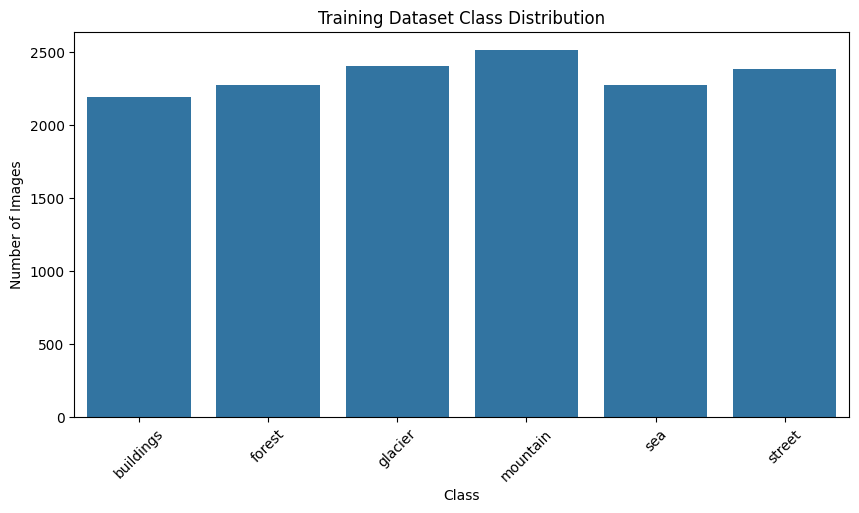

In [43]:
plt.figure(figsize=(10, 5))

sns.barplot(
    data=class_distribution,
    x="Class",
    y="Number of Images"
)

plt.title("Training Dataset Class Distribution")
plt.xlabel("Class")
plt.ylabel("Number of Images")

plt.xticks(rotation=45)

plt.show()

In [44]:
image_sizes = []

for class_name in classes:
    
    class_path = TRAIN_PATH / class_name
    
    image_files = list(class_path.glob("*"))
    
    sample_files = random.sample(
        image_files,
        min(100, len(image_files))
    )
    
    for image_path in sample_files:
        
        try:
            with Image.open(image_path) as img:
                image_sizes.append(img.size)
        
        except Exception as e:
            print("Error:", image_path)


sizes_df = pd.DataFrame(
    image_sizes,
    columns=["Width", "Height"]
)

sizes_df.head()

,Width,Height
0,150,150
1,150,150
2,150,150
3,150,150
4,150,150


In [45]:
sizes_df.describe()

,Width,Height
count,600.0,600.000000
mean,150.0,149.926667
std,0.0,1.536845
min,150.0,113.000000
25%,150.0,150.000000
50%,150.0,150.000000
75%,150.0,150.000000
max,150.0,150.000000


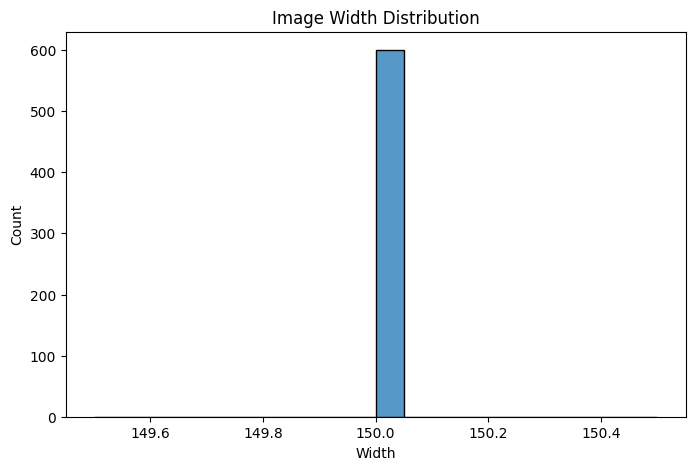

In [46]:
plt.figure(figsize=(8, 5))

sns.histplot(
    sizes_df["Width"],
    bins=20
)

plt.title("Image Width Distribution")

plt.show()

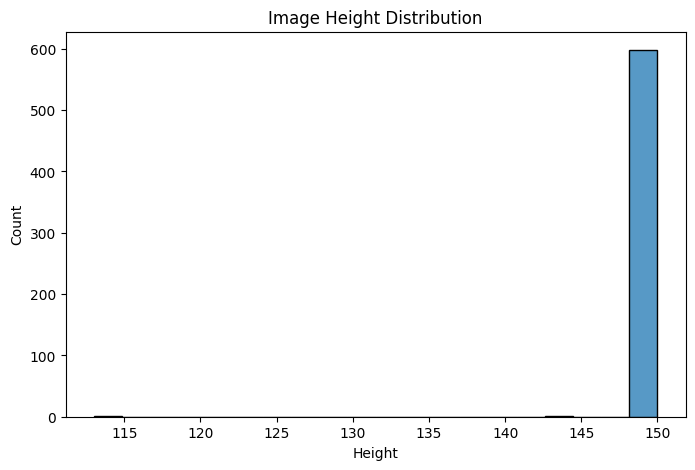

In [47]:
plt.figure(figsize=(8, 5))

sns.histplot(
    sizes_df["Height"],
    bins=20
)

plt.title("Image Height Distribution")

plt.show()

In [48]:
sample_image_path = next(
    TRAIN_PATH.glob("*/*")
)

img = Image.open(sample_image_path)

print("Image mode:", img.mode)
print("Image size:", img.size)

Image mode: RGB
Image size: (150, 150)


In [49]:
img_array = np.array(img)

print("Array shape:", img_array.shape)

Array shape: (150, 150, 3)


In [50]:
#check corrupted
corrupted_images = []

for class_name in classes:
    
    class_path = TRAIN_PATH / class_name
    
    for image_path in class_path.glob("*"):
        
        try:
            with Image.open(image_path) as img:
                img.verify()
        
        except Exception:
            corrupted_images.append(image_path)

print("Number of corrupted images:", len(corrupted_images))

Number of corrupted images: 0


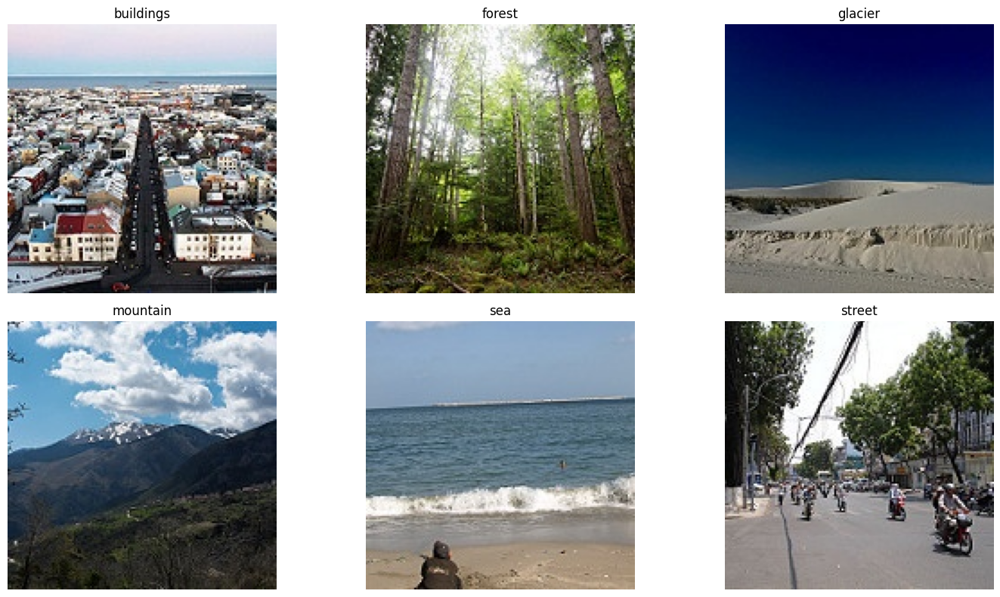

In [51]:
plt.figure(figsize=(15, 8))

for i, class_name in enumerate(classes):
    
    class_path = TRAIN_PATH / class_name
    
    image_path = random.choice(
        list(class_path.glob("*"))
    )
    
    img = Image.open(image_path)
    
    plt.subplot(2, 3, i + 1)
    
    plt.imshow(img)
    
    plt.title(class_name)
    
    plt.axis("off")

plt.tight_layout()
plt.show()

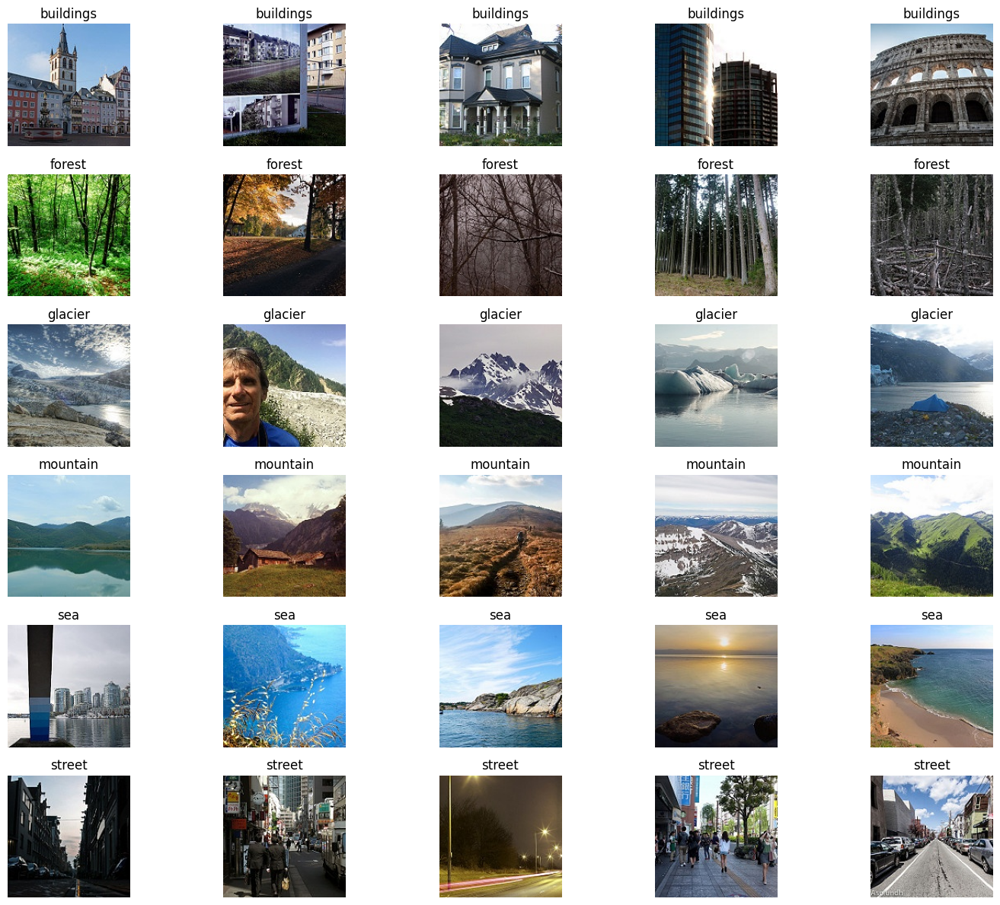

In [52]:
images_per_class = 5

plt.figure(figsize=(15, 12))

plot_index = 1

for class_name in classes:
    
    image_paths = list(
        (TRAIN_PATH / class_name).glob("*")
    )
    
    selected_images = random.sample(
        image_paths,
        images_per_class
    )
    
    for image_path in selected_images:
        
        img = Image.open(image_path)
        
        plt.subplot(
            len(classes),
            images_per_class,
            plot_index
        )
        
        plt.imshow(img)
        
        plt.title(class_name)
        
        plt.axis("off")
        
        plot_index += 1

plt.tight_layout()

plt.show()

In [53]:
#pixel value inspection 
sample_image = Image.open(
    random.choice(
        list((TRAIN_PATH / classes[0]).glob("*"))
    )
)

image_array = np.array(sample_image)

print("Image Shape:", image_array.shape)

print("Minimum Pixel Value:", image_array.min())

print("Maximum Pixel Value:", image_array.max())

print("Mean Pixel Value:", image_array.mean())

Image Shape: (150, 150, 3)
Minimum Pixel Value: 0
Maximum Pixel Value: 255
Mean Pixel Value: 129.4380148148148


The exploratory analysis showed that the dataset consists of six natural scene categories: buildings, forest, glacier, mountain, sea, and street. The images are RGB photographs and may contain variation in visual appearance, lighting conditions, viewpoint, and scene composition. Some categories share similar visual characteristics, particularly glacier and mountain, which may lead to classification confusion. Image dimension analysis was performed to determine the need for resizing, while pixel inspection confirmed the typical RGB value range of 0–255. Therefore, resizing, normalization, and data augmentation are necessary to create a consistent and robust training pipeline.

# ****PreProcessing****

In [54]:
SEED = 42

IMG_SIZE = (150, 150)
BATCH_SIZE = 32

NUM_CLASSES = 6

In [55]:
class_names = sorted([
    folder.name
    for folder in TRAIN_PATH.iterdir()
    if folder.is_dir()
])

print("Classes:", class_names)
print("Number of classes:", len(class_names))

Classes: ['buildings', 'forest', 'glacier', 'mountain', 'sea', 'street']
Number of classes: 6


In [56]:
#label mapping
class_to_index = {
    class_name: index
    for index, class_name in enumerate(class_names)
}

print(class_to_index)

{'buildings': 0, 'forest': 1, 'glacier': 2, 'mountain': 3, 'sea': 4, 'street': 5}


In [57]:
image_paths = []
labels = []

valid_extensions = {".jpg", ".jpeg", ".png", ".bmp"}

for class_name in class_names:
    
    class_folder = TRAIN_PATH / class_name
    
    for image_path in class_folder.iterdir():
        
        if image_path.suffix.lower() in valid_extensions:
            
            image_paths.append(str(image_path))
            labels.append(class_to_index[class_name])

df = pd.DataFrame({
    "filepath": image_paths,
    "label": labels
})

print("Total images:", len(df))

Total images: 14034


In [58]:
df.head()

,filepath,label
0,/kaggle/input/datasets/puneet6060/intel-image-...,0
1,/kaggle/input/datasets/puneet6060/intel-image-...,0
2,/kaggle/input/datasets/puneet6060/intel-image-...,0
3,/kaggle/input/datasets/puneet6060/intel-image-...,0
4,/kaggle/input/datasets/puneet6060/intel-image-...,0


In [59]:
distribution = (
    df["label"]
    .value_counts()
    .sort_index()
    .rename(index=dict(enumerate(class_names)))
)

print(distribution)

label
buildings    2191
forest       2271
glacier      2404
mountain     2512
sea          2274
street       2382
Name: count, dtype: int64


In [60]:
# Preprocessing function
def load_and_preprocess_image(filepath, label):
    
    # Read image
    image = tf.io.read_file(filepath)
    
    # Decode image
    image = tf.image.decode_image(
        image,
        channels=3,
        expand_animations=False
    )
    
    # Resize
    image = tf.image.resize(
        image,
        IMG_SIZE
    )
    
    # Convert pixel values to float
    image = tf.cast(image, tf.float32)
    
    # Normalize 0-255 → 0-1
    image = image / 255.0
    
    return image, label

# **Data Spliting**

In [61]:

from sklearn.model_selection import train_test_split

In [62]:
train_df, temp_df = train_test_split(
    df,
    test_size=0.30,
    random_state=SEED,
    stratify=df["label"]
)

# 15% Validation / 15% Test
val_df, test_df = train_test_split(
    temp_df,
    test_size=0.50,
    random_state=SEED,
    stratify=temp_df["label"]
)
print("Total images:", len(df))
print("Training:", len(train_df))
print("Validation:", len(val_df))
print("Test:", len(test_df))

print(
    "\nCheck:",
    len(train_df) + len(val_df) + len(test_df)
)

Total images: 14034
Training: 9823
Validation: 2105
Test: 2106

Check: 14034


In [63]:
# Show class distributions
def show_distribution(dataframe, name):

    counts = (
        dataframe["label"]
        .value_counts()
        .sort_index()
    )

    print(f"\n{name}")

    for label, count in counts.items():

        print(
            f"{class_names[label]:12s}: {count}"
        )


show_distribution(train_df, "TRAIN")
show_distribution(val_df, "VALIDATION")
show_distribution(test_df, "TEST")


TRAIN
buildings   : 1534
forest      : 1589
glacier     : 1683
mountain    : 1758
sea         : 1592
street      : 1667

VALIDATION
buildings   : 329
forest      : 341
glacier     : 360
mountain    : 377
sea         : 341
street      : 357

TEST
buildings   : 328
forest      : 341
glacier     : 361
mountain    : 377
sea         : 341
street      : 358


#### Why Data Leakage Must Be Avoided

Data leakage occurs when information from the validation or test set is unintentionally used during model training or model selection. This can cause the model to achieve unrealistically high performance because it has already been exposed, directly or indirectly, to information that should be unseen.

To avoid data leakage, the dataset is split into training, validation, and test sets before augmentation. The training set is used to learn the model parameters, the validation set is used for model selection and hyperparameter tuning, and the test set is kept completely untouched until the final evaluation.

The test set should represent new, unseen real-world data. If test images are used during training or repeatedly used to select the best model, the reported performance will no longer provide a reliable estimate of how well the model generalizes. Therefore, augmentation and training-related operations are applied only to the training set, while the validation and test sets remain independent.


# **Data Augmentation**

In [64]:
def build_augmentation_stack(name):
    return tf.keras.Sequential([
        layers.RandomFlip("horizontal"),
        layers.RandomRotation(0.05),
        layers.RandomZoom(0.10),
        layers.RandomTranslation(height_factor=0.10, width_factor=0.10),
        layers.RandomContrast(0.10),
    ], name=name)

data_augmentation    = build_augmentation_stack("data_augmentation")       # used for 150x150 baseline pipeline
data_augmentation_tl = build_augmentation_stack("data_augmentation_tl")    # used for 224x224 transfer pipeline

In [65]:
def create_dataset(dataframe, shuffle=False, augment=False, aug_layer=None):
    paths = dataframe["filepath"].values
    labels = dataframe["label"].values.astype(np.int32)

    dataset = tf.data.Dataset.from_tensor_slices((paths, labels))
    dataset = dataset.map(load_and_preprocess_image, num_parallel_calls=tf.data.AUTOTUNE)

    if shuffle:
        dataset = dataset.shuffle(buffer_size=len(dataframe), seed=SEED)

    dataset = dataset.batch(BATCH_SIZE)

    if augment:
        dataset = dataset.map(
            lambda x, y: (aug_layer(x, training=True), y),
            num_parallel_calls=tf.data.AUTOTUNE
        )

    dataset = dataset.prefetch(tf.data.AUTOTUNE)
    return dataset

train_ds = create_dataset(train_df, shuffle=True,  augment=True,  aug_layer=data_augmentation)
val_ds   = create_dataset(val_df,   shuffle=False, augment=False)
test_ds  = create_dataset(test_df,  shuffle=False, augment=False)

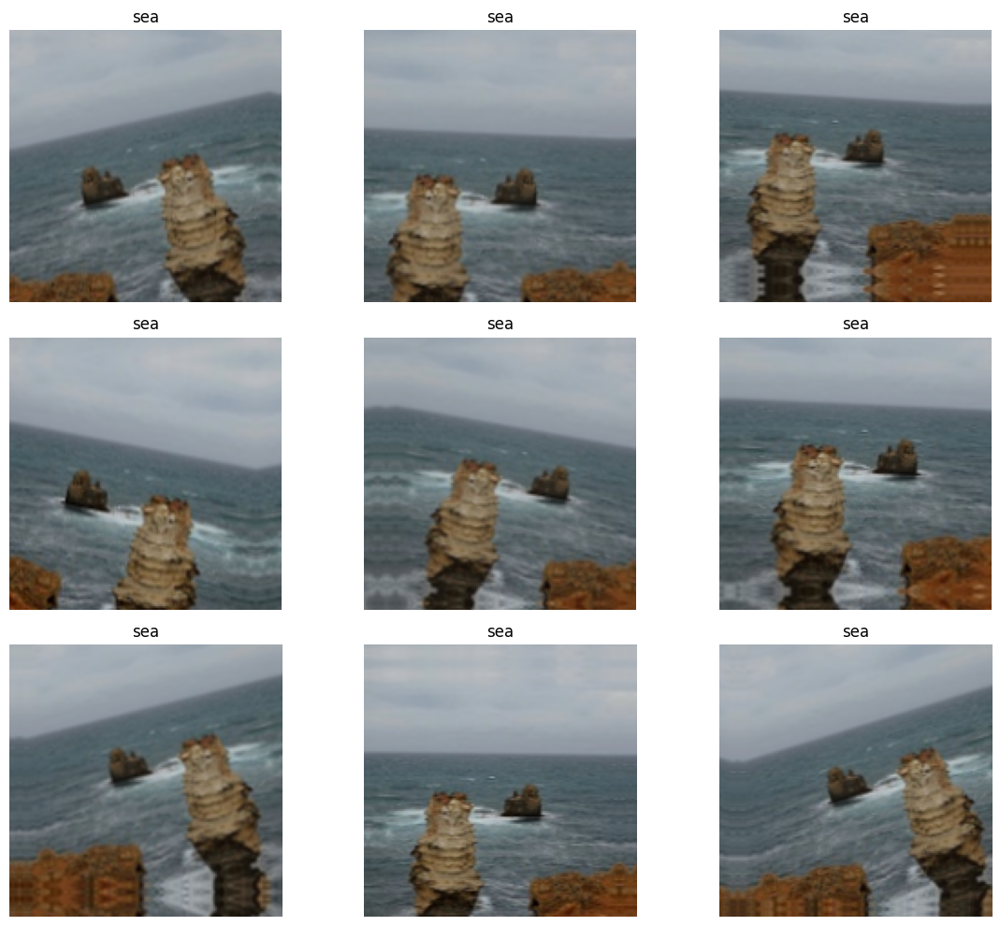

In [66]:
preview_ds = create_dataset(train_df.sample(1, random_state=SEED), shuffle=False, augment=False)
images, labels_batch = next(iter(preview_ds))
original = images[0]

plt.figure(figsize=(12, 10))
for i in range(9):
    augmented = data_augmentation(tf.expand_dims(original, 0), training=True)[0]
    plt.subplot(3, 3, i + 1)
    plt.imshow(tf.clip_by_value(augmented, 0.0, 1.0))
    plt.title(class_names[labels_batch[0].numpy()])
    plt.axis("off")
plt.tight_layout()
plt.show()

#### Why Each Selected Augmentation Is Reasonable for Natural-Scene Images

**1. Random Horizontal Flip**

Horizontal flipping is appropriate because reversing a natural scene from left to right usually does not change its category. For example, a forest, mountain, sea, or glacier remains the same type of scene after being horizontally flipped. This augmentation helps the model become less dependent on the exact left-right orientation of visual features.

**2. Small Random Rotation**

Natural photographs may be captured with slight differences in camera angle or orientation. Applying a small rotation helps the model become more robust to these variations. Only a small rotation is used because large rotations could create unrealistic images, such as an upside-down landscape.

**3. Random Zoom**

Different photographs may be taken from different distances or with different camera zoom levels. Random zoom simulates these variations and helps the model recognize important scene features regardless of whether they appear closer or farther away.

**4. Random Translation**

Important visual features in natural scenes do not always appear in exactly the same position. For example, a mountain or building may appear slightly to the left, right, higher, or lower in different images. Random translation prevents the model from relying too heavily on the exact position of objects and encourages it to learn more general visual patterns.

**5. Random Contrast**

Natural-scene images can be captured under different lighting and weather conditions, such as bright sunlight, cloudy weather, or different camera exposure settings. Random contrast helps the model become more robust to these changes in image appearance while preserving the original scene category.

Overall, these augmentation techniques increase the diversity of the training data and help reduce overfitting. They are suitable because the applied transformations are small and realistic, meaning they change the appearance of the image without changing its actual class label.


# **Basline Model**

In [67]:
baseline_model = tf.keras.Sequential([
    layers.Input(shape=(150, 150, 3)),

    # Block 1
    layers.Conv2D(32, (3, 3), padding="same", activation="relu"),
    layers.BatchNormalization(),
    layers.Conv2D(32, (3, 3), padding="same", activation="relu"),
    layers.BatchNormalization(),
    layers.MaxPooling2D(pool_size=(2, 2)),

    # Block 2
    layers.Conv2D(64, (3, 3), padding="same", activation="relu"),
    layers.BatchNormalization(),
    layers.Conv2D(64, (3, 3), padding="same", activation="relu"),
    layers.BatchNormalization(),
    layers.MaxPooling2D(pool_size=(2, 2)),

    # Block 3
    layers.Conv2D(128, (3, 3), padding="same", activation="relu"),
    layers.BatchNormalization(),
    layers.MaxPooling2D(pool_size=(2, 2)),

    # Block 4
    layers.Conv2D(256, (3, 3), padding="same", activation="relu"),
    layers.BatchNormalization(),
    layers.MaxPooling2D(pool_size=(2, 2)),
    layers.Dropout(0.2),           # light spatial dropout before pooling to head

    layers.GlobalAveragePooling2D(),
    layers.Dropout(0.4),           # slightly lower than 0.5 — paired with LR/BN fixes below
    layers.Dense(128, activation="relu"),
    layers.Dropout(0.3),
    layers.Dense(NUM_CLASSES, activation="softmax")
], name="Baseline_CNN")

In [68]:
baseline_model.summary()

Model: "Baseline_CNN"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ conv2d_6 (Conv2D)               │ (None, 150, 150, 32)   │           896 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_6           │ (None, 150, 150, 32)   │           128 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_7 (Conv2D)               │ (None, 150, 150, 32)   │         9,248 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_7           │ (None, 150, 150, 32)   │           128 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_4 (MaxPooling2D)  │ (None, 75, 75, 32)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_8 (Conv2D)               │ (None, 75, 75, 64)     │        18,496 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_8           │ (None, 75, 75, 64)     │           256 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_9 (Conv2D)               │ (None, 75, 75, 64)     │        36,928 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_9           │ (None, 75, 75, 64)     │           256 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_5 (MaxPooling2D)  │ (None, 37, 37, 64)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_10 (Conv2D)              │ (None, 37, 37, 128)    │        73,856 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_10          │ (None, 37, 37, 128)    │           512 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_6 (MaxPooling2D)  │ (None, 18, 18, 128)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_11 (Conv2D)              │ (None, 18, 18, 256)    │       295,168 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_11          │ (None, 18, 18, 256)    │         1,024 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_7 (MaxPooling2D)  │ (None, 9, 9, 256)      │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_3 (Dropout)             │ (None, 9, 9, 256)      │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ global_average_pooling2d_1      │ (None, 256)            │             0 │
│ (GlobalAveragePooling2D)        │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_4 (Dropout)             │ (None, 256)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2 (Dense)                 │ (None, 128)            │        32,896 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_5 (Dropout)             │ (None, 128)            │             0 │
├─────────────────────────────────┼────────────────────────┼─────────────

 Total params: 470,566 (1.80 MB)

 Trainable params: 469,414 (1.79 MB)

 Non-trainable params: 1,152 (4.50 KB)

In [69]:
baseline_model.compile(
    optimizer=tf.keras.optimizers.Adam(learning_rate=3e-4),
    loss="sparse_categorical_crossentropy",
    metrics=["accuracy"]
)

In [70]:
early_stopping = tf.keras.callbacks.EarlyStopping(
    monitor="val_loss",
    patience=6,
    restore_best_weights=True
)

reduce_lr_baseline = tf.keras.callbacks.ReduceLROnPlateau(
    monitor="val_loss",
    factor=0.5,
    patience=2,
    min_lr=1e-6
)

In [71]:
start_time = time.time()
history_baseline = baseline_model.fit(
    train_ds,
    validation_data=val_ds,
    epochs=30,
    callbacks=[early_stopping, reduce_lr_baseline]
)
baseline_training_time = time.time() - start_time

Epoch 1/30


2026-09-05 18:21:38.092677: E external/local_xla/xla/stream_executor/cuda/cuda_timer.cc:86] Delay kernel timed out: measured time has sub-optimal accuracy. There may be a missing warmup execution, please investigate in Nsight Systems.
2026-09-05 18:21:38.246704: E external/local_xla/xla/stream_executor/cuda/cuda_timer.cc:86] Delay kernel timed out: measured time has sub-optimal accuracy. There may be a missing warmup execution, please investigate in Nsight Systems.
2026-09-05 18:21:38.864149: E external/local_xla/xla/stream_executor/cuda/cuda_timer.cc:86] Delay kernel timed out: measured time has sub-optimal accuracy. There may be a missing warmup execution, please investigate in Nsight Systems.
2026-09-05 18:21:39.012302: E external/local_xla/xla/stream_executor/cuda/cuda_timer.cc:86] Delay kernel timed out: measured time has sub-optimal accuracy. There may be a missing warmup execution, please investigate in Nsight Systems.
2026-09-05 18:21:40.404927: E external/local_xla/xla/stream_

  2/307 ━━━━━━━━━━━━━━━━━━━━ 26s 86ms/step - accuracy: 0.2109 - loss: 2.3891   

I0000 00:00:1788632506.591412    4293 device_compiler.h:196] Compiled cluster using XLA!  This line is logged at most once for the lifetime of the process.


306/307 ━━━━━━━━━━━━━━━━━━━━ 0s 89ms/step - accuracy: 0.4886 - loss: 1.3410

2026-09-05 18:22:16.864349: E external/local_xla/xla/stream_executor/cuda/cuda_timer.cc:86] Delay kernel timed out: measured time has sub-optimal accuracy. There may be a missing warmup execution, please investigate in Nsight Systems.
2026-09-05 18:22:17.018895: E external/local_xla/xla/stream_executor/cuda/cuda_timer.cc:86] Delay kernel timed out: measured time has sub-optimal accuracy. There may be a missing warmup execution, please investigate in Nsight Systems.
2026-09-05 18:22:17.677762: E external/local_xla/xla/stream_executor/cuda/cuda_timer.cc:86] Delay kernel timed out: measured time has sub-optimal accuracy. There may be a missing warmup execution, please investigate in Nsight Systems.
2026-09-05 18:22:17.825929: E external/local_xla/xla/stream_executor/cuda/cuda_timer.cc:86] Delay kernel timed out: measured time has sub-optimal accuracy. There may be a missing warmup execution, please investigate in Nsight Systems.
2026-09-05 18:22:19.212057: E external/local_xla/xla/stream_

307/307 ━━━━━━━━━━━━━━━━━━━━ 64s 144ms/step - accuracy: 0.5609 - loss: 1.1393 - val_accuracy: 0.2456 - val_loss: 2.1165 - learning_rate: 3.0000e-04
Epoch 2/30
307/307 ━━━━━━━━━━━━━━━━━━━━ 32s 93ms/step - accuracy: 0.6819 - loss: 0.8419 - val_accuracy: 0.7188 - val_loss: 0.7358 - learning_rate: 3.0000e-04
Epoch 3/30
307/307 ━━━━━━━━━━━━━━━━━━━━ 33s 94ms/step - accuracy: 0.7335 - loss: 0.7218 - val_accuracy: 0.6879 - val_loss: 0.8131 - learning_rate: 3.0000e-04
Epoch 4/30
307/307 ━━━━━━━━━━━━━━━━━━━━ 33s 94ms/step - accuracy: 0.7601 - loss: 0.6593 - val_accuracy: 0.7036 - val_loss: 0.8353 - learning_rate: 3.0000e-04
Epoch 5/30
307/307 ━━━━━━━━━━━━━━━━━━━━ 33s 93ms/step - accuracy: 0.7937 - loss: 0.5724 - val_accuracy: 0.7743 - val_loss: 0.6424 - learning_rate: 1.5000e-04
Epoch 6/30
307/307 ━━━━━━━━━━━━━━━━━━━━ 34s 93ms/step - accuracy: 0.7977 - loss: 0.5507 - val_accuracy: 0.7050 - val_loss: 0.8748 - learning_rate: 1.5000e-04
Epoch 7/30
307/307 ━━━━━━━━━━━━━━━━━━━━ 33s 94ms/step - accura

# **Training Curves**

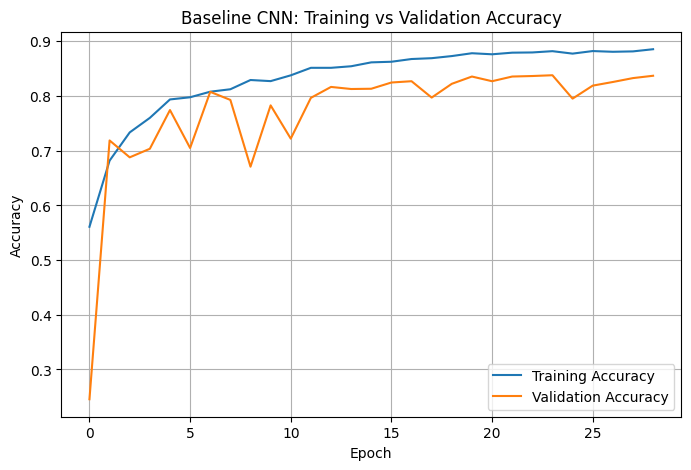

In [72]:
plt.figure(figsize=(8, 5))

plt.plot(
    history_baseline.history["accuracy"],
    label="Training Accuracy"
)

plt.plot(
    history_baseline.history["val_accuracy"],
    label="Validation Accuracy"
)

plt.xlabel("Epoch")
plt.ylabel("Accuracy")

plt.title("Baseline CNN: Training vs Validation Accuracy")

plt.legend()
plt.grid()

plt.show()

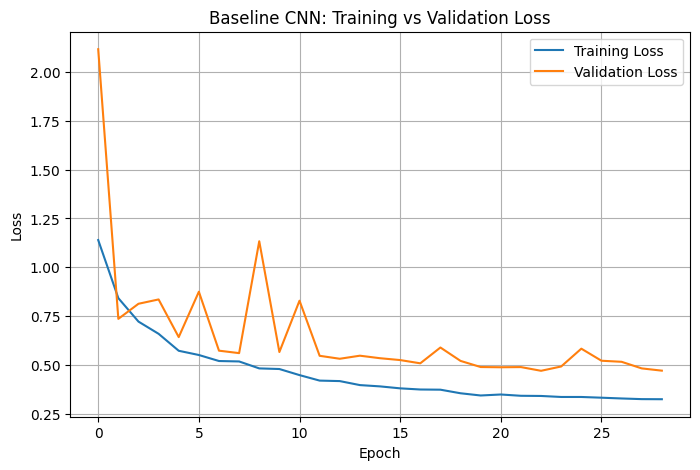

In [73]:
plt.figure(figsize=(8, 5))

plt.plot(
    history_baseline.history["loss"],
    label="Training Loss"
)

plt.plot(
    history_baseline.history["val_loss"],
    label="Validation Loss"
)

plt.xlabel("Epoch")
plt.ylabel("Loss")

plt.title("Baseline CNN: Training vs Validation Loss")

plt.legend()
plt.grid()

plt.show()

# **Model Evaluation**

In [74]:
test_loss, test_accuracy = baseline_model.evaluate(
    test_ds,
    verbose=1
)

print(f"Test Loss: {test_loss:.4f}")
print(f"Test Accuracy: {test_accuracy:.4f}")

66/66 ━━━━━━━━━━━━━━━━━━━━ 3s 45ms/step - accuracy: 0.8481 - loss: 0.4184
Test Loss: 0.4184
Test Accuracy: 0.8481


In [75]:
y_true = []
y_pred = []
y_prob = []

for images, labels in test_ds:
    
    predictions = baseline_model.predict(
        images,
        verbose=0
    )
    
    predicted_classes = np.argmax(
        predictions,
        axis=1
    )
    
    y_true.extend(labels.numpy())
    y_pred.extend(predicted_classes)
    y_prob.extend(predictions)

y_true = np.array(y_true)
y_pred = np.array(y_pred)
y_prob = np.array(y_prob)

print("True labels shape:", y_true.shape)
print("Predictions shape:", y_pred.shape)
print("Probabilities shape:", y_prob.shape)

True labels shape: (2106,)
Predictions shape: (2106,)
Probabilities shape: (2106, 6)


In [76]:
from sklearn.metrics import classification_report
print(
    classification_report(
        y_true,
        y_pred,
        target_names=class_names
    )
)

              precision    recall  f1-score   support

   buildings       0.79      0.87      0.82       328
      forest       0.94      0.98      0.96       341
     glacier       0.88      0.72      0.79       361
    mountain       0.80      0.80      0.80       377
         sea       0.85      0.88      0.86       341
      street       0.84      0.85      0.85       358

    accuracy                           0.85      2106
   macro avg       0.85      0.85      0.85      2106
weighted avg       0.85      0.85      0.85      2106



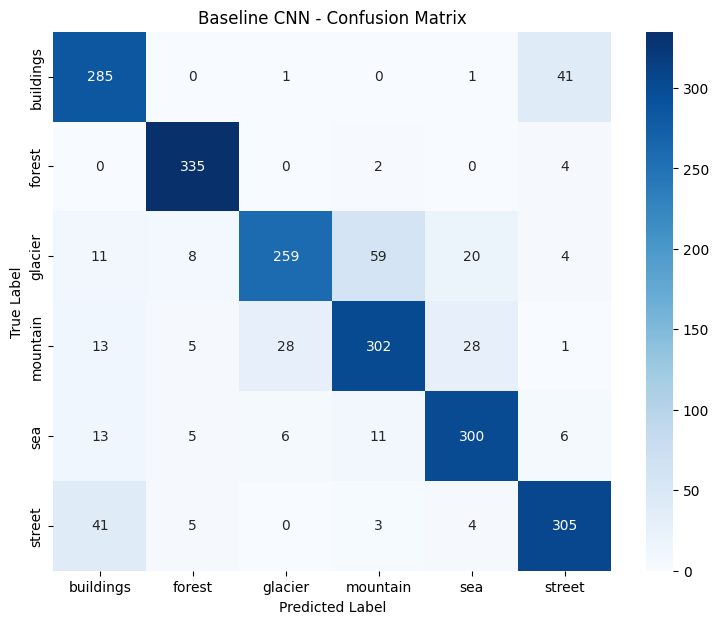

In [77]:
from sklearn.metrics import confusion_matrix
import seaborn as sns

cm = confusion_matrix(
    y_true,
    y_pred
)


plt.figure(figsize=(9, 7))

sns.heatmap(
    cm,
    annot=True,
    fmt="d",
    cmap="Blues",
    xticklabels=class_names,
    yticklabels=class_names
)

plt.xlabel("Predicted Label")
plt.ylabel("True Label")

plt.title("Baseline CNN - Confusion Matrix")

plt.show()

In [78]:
from sklearn.metrics import precision_recall_fscore_support

precision, recall, f1, support = precision_recall_fscore_support(
    y_true,
    y_pred,
    labels=range(NUM_CLASSES),
    zero_division=0
)

per_class_results = pd.DataFrame({
    "Class": class_names,
    "Precision": precision,
    "Recall": recall,
    "F1-Score": f1,
    "Support": support
})

per_class_results

,Class,Precision,Recall,F1-Score,Support
0,buildings,0.785124,0.868902,0.824891,328
1,forest,0.935754,0.982405,0.958512,341
2,glacier,0.880952,0.717452,0.790840,361
3,mountain,0.801061,0.801061,0.801061,377
4,sea,0.849858,0.879765,0.864553,341
5,street,0.844875,0.851955,0.848401,358


In [79]:
best_class = per_class_results.loc[
    per_class_results["F1-Score"].idxmax()
]

worst_class = per_class_results.loc[
    per_class_results["F1-Score"].idxmin()
]

print(
    "Best performing class:",
    best_class["Class"],
    "| F1:",
    round(best_class["F1-Score"], 4)
)

print(
    "Hardest class:",
    worst_class["Class"],
    "| F1:",
    round(worst_class["F1-Score"], 4)
)

Best performing class: forest | F1: 0.9585
Hardest class: glacier | F1: 0.7908


# **Error Analysis**

In [80]:
incorrect_indices = np.where(
    y_true != y_pred
)[0]

print(
    "Number of incorrect predictions:",
    len(incorrect_indices)
)

print(
    "Error rate:",
    len(incorrect_indices) / len(y_true)
)

Number of incorrect predictions: 320
Error rate: 0.15194681861348527


In [81]:
test_df = test_df.reset_index(drop=True)


In [82]:
from PIL import Image

def load_original_image(filepath):
    
    image = Image.open(filepath)
    
    image = image.convert("RGB")
    
    return image

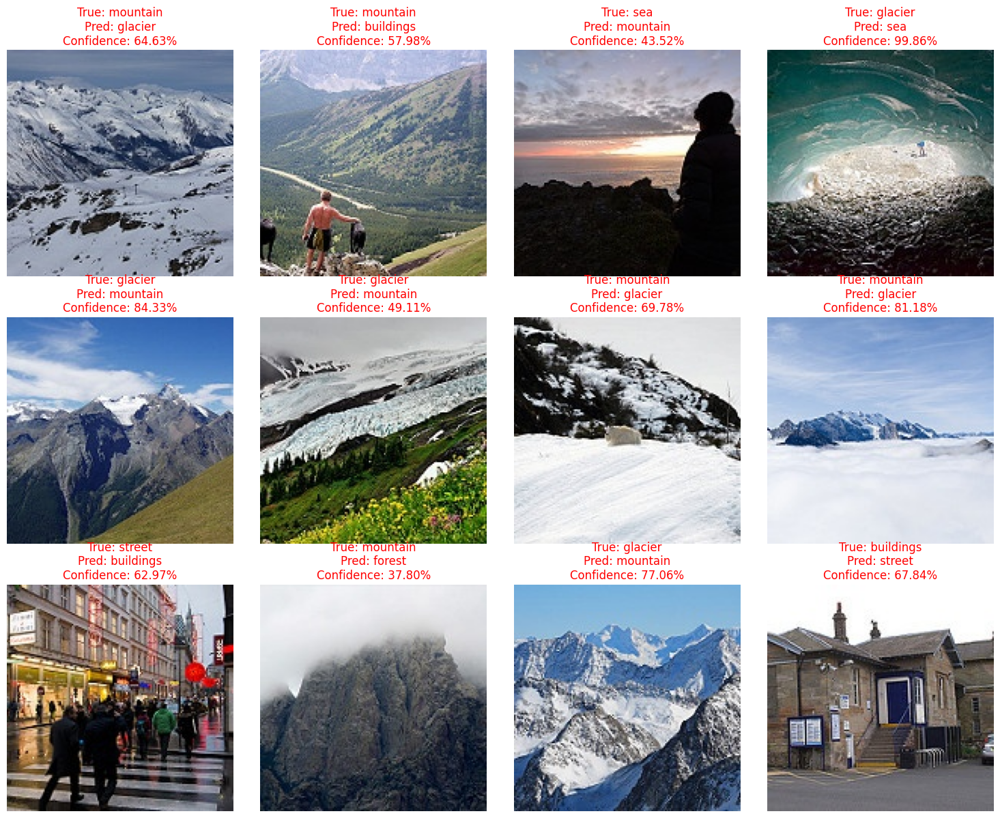

In [83]:
num_images = min(12, len(incorrect_indices))

selected_indices = np.random.choice(
    incorrect_indices,
    size=num_images,
    replace=False
)

plt.figure(figsize=(15, 12))

for i, idx in enumerate(selected_indices):
    
    image = load_original_image(
        test_df.iloc[idx]["filepath"]
    )
    
    true_label = class_names[
        y_true[idx]
    ]
    
    predicted_label = class_names[
        y_pred[idx]
    ]
    
    confidence = y_prob[idx][
        y_pred[idx]
    ]
    
    plt.subplot(3, 4, i + 1)
    
    plt.imshow(image)
    
    plt.title(
        f"True: {true_label}\n"
        f"Pred: {predicted_label}\n"
        f"Confidence: {confidence:.2%}",
        color="red"
    )
    
    plt.axis("off")

plt.tight_layout()
plt.show()

In [84]:
cm_copy = cm.copy()

# Remove correct predictions
np.fill_diagonal(
    cm_copy,
    0
)

# Find largest confusion
true_idx, pred_idx = np.unravel_index(
    np.argmax(cm_copy),
    cm_copy.shape
)

print(
    "Most common confusion:"
)

print(
    f"True class: {class_names[true_idx]}"
)

print(
    f"Predicted as: {class_names[pred_idx]}"
)

print(
    f"Number of mistakes: {cm_copy[true_idx, pred_idx]}"
)

Most common confusion:
True class: glacier
Predicted as: mountain
Number of mistakes: 59


In [85]:
confusions = []

for true_class in range(NUM_CLASSES):
    
    for predicted_class in range(NUM_CLASSES):
        
        if (
            true_class != predicted_class
            and cm[true_class, predicted_class] > 0
        ):
            
            confusions.append({
                "True Class": class_names[true_class],
                "Predicted Class": class_names[predicted_class],
                "Count": cm[true_class, predicted_class]
            })


confusion_df = pd.DataFrame(
    confusions
).sort_values(
    "Count",
    ascending=False
)

confusion_df.head(10)

,True Class,Predicted Class,Count
7,glacier,mountain,59
2,buildings,street,41
20,street,buildings,41
13,mountain,sea,28
12,mountain,glacier,28
8,glacier,sea,20
10,mountain,buildings,13
15,sea,buildings,13
18,sea,mountain,11
5,glacier,buildings,11


# ***Transfer Learning***

In [86]:
TL_IMG_SIZE = (224, 224)

In [87]:
def load_image_for_transfer(filepath, label):
    image = tf.io.read_file(filepath)
    image = tf.image.decode_image(image, channels=3, expand_animations=False)
    image = tf.image.resize(image, TL_IMG_SIZE)
    image = tf.cast(image, tf.float32)
    return image, label

In [88]:
def create_transfer_dataset(dataframe, shuffle=False, augment=False, aug_layer=None):
    paths = dataframe["filepath"].values
    labels = dataframe["label"].values.astype(np.int32)

    dataset = tf.data.Dataset.from_tensor_slices((paths, labels))
    dataset = dataset.map(load_image_for_transfer, num_parallel_calls=tf.data.AUTOTUNE)

    if shuffle:
        dataset = dataset.shuffle(buffer_size=len(dataframe), seed=SEED)

    dataset = dataset.batch(BATCH_SIZE)

    if augment:
        dataset = dataset.map(
            lambda x, y: (aug_layer(x, training=True), y),
            num_parallel_calls=tf.data.AUTOTUNE
        )

    dataset = dataset.prefetch(tf.data.AUTOTUNE)
    return dataset

train_tl_ds = create_transfer_dataset(train_df, shuffle=True,  augment=True,  aug_layer=data_augmentation_tl)
val_tl_ds   = create_transfer_dataset(val_df,   shuffle=False, augment=False)
test_tl_ds  = create_transfer_dataset(test_df,  shuffle=False, augment=False)

In [90]:
base_model = tf.keras.applications.EfficientNetB0(
    include_top=False,
    weights="imagenet",
    input_shape=(224, 224, 3)
)

In [91]:
base_model.trainable = False

In [92]:
inputs = layers.Input(shape=(224, 224, 3))
x = base_model(inputs, training=False)
x = layers.GlobalAveragePooling2D()(x)
x = layers.Dropout(0.3)(x)
x = layers.Dense(128, activation="relu")(x)
x = layers.Dropout(0.2)(x)
outputs = layers.Dense(NUM_CLASSES, activation="softmax")(x)

transfer_model = tf.keras.Model(inputs, outputs, name="EfficientNetB0_TransferLearning")

In [93]:
transfer_model.compile(
    optimizer=tf.keras.optimizers.Adam(
        learning_rate=0.001
    ),
    
    loss="sparse_categorical_crossentropy",
    
    metrics=["accuracy"]
)

In [94]:
early_stopping_tl = tf.keras.callbacks.EarlyStopping(
    monitor="val_loss",
    patience=5,
    restore_best_weights=True
)

reduce_lr = tf.keras.callbacks.ReduceLROnPlateau(
    monitor="val_loss",
    factor=0.2,
    patience=2,
    min_lr=1e-6
)

In [ ]:
import time

start_time = time.time()

history_transfer = transfer_model.fit(
    train_tl_ds,
    validation_data=val_tl_ds,
    epochs=15,
    callbacks=[
        early_stopping_tl,
        reduce_lr
    ]
)

transfer_training_time = time.time() - start_time

print(
    f"Training time: {transfer_training_time / 60:.2f} minutes"
)

Epoch 1/15


2026-09-05 18:38:41.562635: E external/local_xla/xla/stream_executor/cuda/cuda_timer.cc:86] Delay kernel timed out: measured time has sub-optimal accuracy. There may be a missing warmup execution, please investigate in Nsight Systems.
2026-09-05 18:38:41.706138: E external/local_xla/xla/stream_executor/cuda/cuda_timer.cc:86] Delay kernel timed out: measured time has sub-optimal accuracy. There may be a missing warmup execution, please investigate in Nsight Systems.
2026-09-05 18:38:42.057836: E external/local_xla/xla/stream_executor/cuda/cuda_timer.cc:86] Delay kernel timed out: measured time has sub-optimal accuracy. There may be a missing warmup execution, please investigate in Nsight Systems.
2026-09-05 18:38:42.198749: E external/local_xla/xla/stream_executor/cuda/cuda_timer.cc:86] Delay kernel timed out: measured time has sub-optimal accuracy. There may be a missing warmup execution, please investigate in Nsight Systems.
2026-09-05 18:38:42.996905: E external/local_xla/xla/stream_

306/307 ━━━━━━━━━━━━━━━━━━━━ 0s 182ms/step - accuracy: 0.8104 - loss: 0.5206

2026-09-05 18:39:53.128078: E external/local_xla/xla/stream_executor/cuda/cuda_timer.cc:86] Delay kernel timed out: measured time has sub-optimal accuracy. There may be a missing warmup execution, please investigate in Nsight Systems.
2026-09-05 18:39:53.271147: E external/local_xla/xla/stream_executor/cuda/cuda_timer.cc:86] Delay kernel timed out: measured time has sub-optimal accuracy. There may be a missing warmup execution, please investigate in Nsight Systems.
2026-09-05 18:39:53.621377: E external/local_xla/xla/stream_executor/cuda/cuda_timer.cc:86] Delay kernel timed out: measured time has sub-optimal accuracy. There may be a missing warmup execution, please investigate in Nsight Systems.
2026-09-05 18:39:53.762929: E external/local_xla/xla/stream_executor/cuda/cuda_timer.cc:86] Delay kernel timed out: measured time has sub-optimal accuracy. There may be a missing warmup execution, please investigate in Nsight Systems.
2026-09-05 18:39:54.567315: E external/local_xla/xla/stream_

307/307 ━━━━━━━━━━━━━━━━━━━━ 0s 234ms/step - accuracy: 0.8106 - loss: 0.5201

2026-09-05 18:40:15.884151: E external/local_xla/xla/stream_executor/cuda/cuda_timer.cc:86] Delay kernel timed out: measured time has sub-optimal accuracy. There may be a missing warmup execution, please investigate in Nsight Systems.
2026-09-05 18:40:16.026576: E external/local_xla/xla/stream_executor/cuda/cuda_timer.cc:86] Delay kernel timed out: measured time has sub-optimal accuracy. There may be a missing warmup execution, please investigate in Nsight Systems.
2026-09-05 18:40:16.364258: E external/local_xla/xla/stream_executor/cuda/cuda_timer.cc:86] Delay kernel timed out: measured time has sub-optimal accuracy. There may be a missing warmup execution, please investigate in Nsight Systems.
2026-09-05 18:40:16.505126: E external/local_xla/xla/stream_executor/cuda/cuda_timer.cc:86] Delay kernel timed out: measured time has sub-optimal accuracy. There may be a missing warmup execution, please investigate in Nsight Systems.
2026-09-05 18:40:17.280232: E external/local_xla/xla/stream_

307/307 ━━━━━━━━━━━━━━━━━━━━ 124s 297ms/step - accuracy: 0.8674 - loss: 0.3661 - val_accuracy: 0.9230 - val_loss: 0.2280 - learning_rate: 0.0010
Epoch 2/15
307/307 ━━━━━━━━━━━━━━━━━━━━ 65s 190ms/step - accuracy: 0.9018 - loss: 0.2617 - val_accuracy: 0.9178 - val_loss: 0.2256 - learning_rate: 0.0010
Epoch 3/15
307/307 ━━━━━━━━━━━━━━━━━━━━ 65s 190ms/step - accuracy: 0.9115 - loss: 0.2444 - val_accuracy: 0.9268 - val_loss: 0.2202 - learning_rate: 0.0010
Epoch 4/15
307/307 ━━━━━━━━━━━━━━━━━━━━ 65s 191ms/step - accuracy: 0.9147 - loss: 0.2248 - val_accuracy: 0.9150 - val_loss: 0.2279 - learning_rate: 0.0010
Epoch 5/15
307/307 ━━━━━━━━━━━━━━━━━━━━ 65s 190ms/step - accuracy: 0.9214 - loss: 0.2074 - val_accuracy: 0.9230 - val_loss: 0.2146 - learning_rate: 0.0010
Epoch 6/15
307/307 ━━━━━━━━━━━━━━━━━━━━ 64s 187ms/step - accuracy: 0.9216 - loss: 0.2031 - val_accuracy: 0.9292 - val_loss: 0.2061 - learning_rate: 0.0010
Epoch 7/15
307/307 ━━━━━━━━━━━━━━━━━━━━ 64s 187ms/step - accuracy: 0.9245 - loss

In [ ]:
tl_test_loss, tl_test_accuracy = transfer_model.evaluate(
    test_tl_ds,
    verbose=1
)

print(f"Test Accuracy: {tl_test_accuracy:.4f}")

In [ ]:
base_model.trainable = True
fine_tune_at = len(base_model.layers) - 20
for layer in base_model.layers[:fine_tune_at]:
    layer.trainable = False

transfer_model.compile(
    optimizer=tf.keras.optimizers.Adam(learning_rate=1e-5),
    loss="sparse_categorical_crossentropy",
    metrics=["accuracy"]
)

finetune_start_time = time.time()

history_finetune = transfer_model.fit(
    train_tl_ds, validation_data=val_tl_ds, epochs=10,
    callbacks=[early_stopping_tl, reduce_lr]
)

finetune_training_time = time.time() - finetune_start_time

# Total time = frozen-head phase (cell 70) + fine-tuning phase
transfer_training_time = transfer_training_time + finetune_training_time

tl_ft_test_loss, tl_ft_test_accuracy = transfer_model.evaluate(test_tl_ds, verbose=1)
print(f"Fine-tuned Test Accuracy: {tl_ft_test_accuracy:.4f}")
print(f"Total transfer learning time: {transfer_training_time / 60:.2f} minutes")

307/307 ━━━━━━━━━━━━━━━━━━━━ 114s 268ms/step - accuracy: 0.8395 - loss: 0.4438 - val_accuracy: 0.9131 - val_loss: 0.2443 - learning_rate: 1.0000e-05
Epoch 2/10
307/307 ━━━━━━━━━━━━━━━━━━━━ 64s 188ms/step - accuracy: 0.8810 - loss: 0.3235 - val_accuracy: 0.9221 - val_loss: 0.2315 - learning_rate: 1.0000e-05
Epoch 3/10
307/307 ━━━━━━━━━━━━━━━━━━━━ 66s 191ms/step - accuracy: 0.8886 - loss: 0.2995 - val_accuracy: 0.9221 - val_loss: 0.2302 - learning_rate: 2.0000e-06
Epoch 4/10
307/307 ━━━━━━━━━━━━━━━━━━━━ 65s 189ms/step - accuracy: 0.8933 - loss: 0.2853 - val_accuracy: 0.9221 - val_loss: 0.2274 - learning_rate: 2.0000e-06
Epoch 5/10
307/307 ━━━━━━━━━━━━━━━━━━━━ 65s 188ms/step - accuracy: 0.8965 - loss: 0.2793 - val_accuracy: 0.9230 - val_loss: 0.2272 - learning_rate: 1.0000e-06
66/66 ━━━━━━━━━━━━━━━━━━━━ 6s 97ms/step - accuracy: 0.9169 - loss: 0.2307
Fine-tuned Test Accuracy: 0.9169


In [98]:
y_true_tl = []
y_pred_tl = []
y_prob_tl = []

for images, labels in test_tl_ds:
    predictions = transfer_model.predict(images, verbose=0)
    predicted_classes = np.argmax(predictions, axis=1)

    y_true_tl.extend(labels.numpy())
    y_pred_tl.extend(predicted_classes)
    y_prob_tl.extend(predictions)

y_true_tl = np.array(y_true_tl)
y_pred_tl = np.array(y_pred_tl)
y_prob_tl = np.array(y_prob_tl)

print("True labels shape:", y_true_tl.shape)
print("Predictions shape:", y_pred_tl.shape)

True labels shape: (2106,)
Predictions shape: (2106,)


In [101]:
transfer_report_dict = classification_report(
    y_true_tl, y_pred_tl, target_names=class_names, output_dict=True
)

print(classification_report(y_true_tl, y_pred_tl, target_names=class_names))

              precision    recall  f1-score   support

   buildings       0.96      0.88      0.92       328
      forest       0.98      0.99      0.98       341
     glacier       0.83      0.88      0.85       361
    mountain       0.91      0.84      0.87       377
         sea       0.95      0.96      0.96       341
      street       0.89      0.96      0.93       358

    accuracy                           0.92      2106
   macro avg       0.92      0.92      0.92      2106
weighted avg       0.92      0.92      0.92      2106



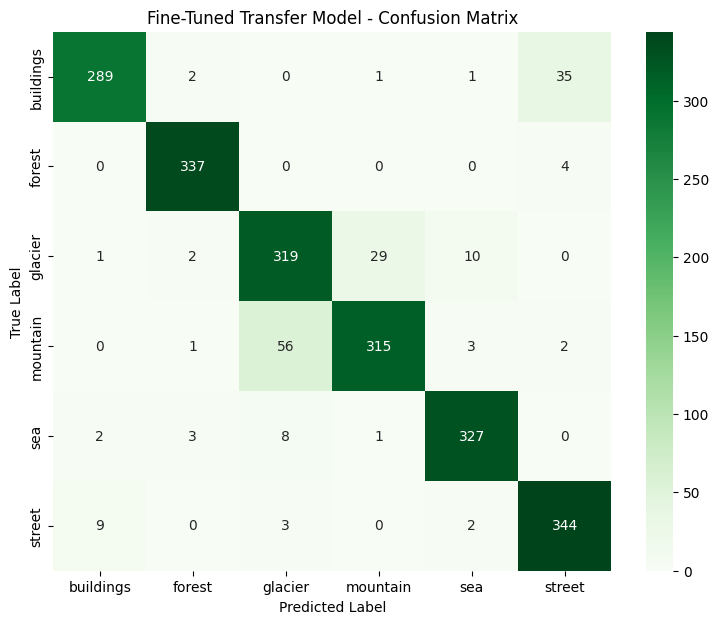

In [99]:
cm_tl = confusion_matrix(y_true_tl, y_pred_tl)

plt.figure(figsize=(9, 7))
sns.heatmap(cm_tl, annot=True, fmt="d", cmap="Greens",
            xticklabels=class_names, yticklabels=class_names)
plt.xlabel("Predicted Label")
plt.ylabel("True Label")
plt.title("Fine-Tuned Transfer Model - Confusion Matrix")
plt.show()

# **Model comparsion**

In [102]:
def count_params(model):
    trainable = int(sum(np.prod(v.shape) for v in model.trainable_weights))
    non_trainable = int(sum(np.prod(v.shape) for v in model.non_trainable_weights))
    return trainable, non_trainable

def best_val_accuracy(history):
    best_epoch = int(np.argmin(history.history["val_loss"]))
    return history.history["val_accuracy"][best_epoch]

baseline_trainable, baseline_nontrainable = count_params(baseline_model)
transfer_trainable, transfer_nontrainable = count_params(transfer_model)

baseline_best_val_acc = best_val_accuracy(history_baseline)
transfer_best_val_acc = best_val_accuracy(history_finetune)   # final, post fine-tuning state

baseline_f1_weighted = per_class_results["F1-Score"].mean()   # or classification_report if you prefer weighted avg
transfer_f1_weighted = transfer_report_dict["weighted avg"]["f1-score"]

In [103]:
comparison_df = pd.DataFrame([
    {
        "Model": "Baseline CNN (from scratch)",
        "Input Size": "150x150",
        "Trainable Params": baseline_trainable,
        "Val Accuracy": round(baseline_best_val_acc, 4),
        "Test Accuracy": round(test_accuracy, 4),
        "F1-Score (weighted)": round(baseline_f1_weighted, 4),
        "Training Time (min)": round(baseline_training_time / 60, 2)
    },
    {
        "Model": "EfficientNetB0 (fine-tuned)",
        "Input Size": "224x224",
        "Trainable Params": transfer_trainable,
        "Val Accuracy": round(transfer_best_val_acc, 4),
        "Test Accuracy": round(tl_ft_test_accuracy, 4),
        "F1-Score (weighted)": round(transfer_f1_weighted, 4),
        "Training Time (min)": round(transfer_training_time / 60, 2)
    }
])

comparison_df

,Model,Input Size,Trainable Params,Val Accuracy,Test Accuracy,F1-Score (weighted),Training Time (min)
0,Baseline CNN (from scratch),150x150,469414,0.8366,0.8481,0.8480,16.43
1,EfficientNetB0 (fine-tuned),224x224,1515702,0.9230,0.9169,0.9168,17.17


In [ ]:
transfer_model.save("best_model.keras")
print("Model saved as best_model.keras")

# **Prediction on New Images**

In [ ]:
def predict_image(filepath, model, img_size, class_names, rescale):
    image = Image.open(filepath).convert("RGB")
    image_resized = image.resize(img_size)

    image_array = np.array(image_resized).astype(np.float32)
    if rescale:
        image_array = image_array / 255.0

    image_batch = np.expand_dims(image_array, axis=0)

    predictions = model.predict(image_batch, verbose=0)[0]
    predicted_index = np.argmax(predictions)
    predicted_class = class_names[predicted_index]
    confidence = predictions[predicted_index]

    plt.figure(figsize=(4, 4))
    plt.imshow(image)
    plt.title(f"Pred: {predicted_class}\nConfidence: {confidence:.2%}")
    plt.axis("off")
    plt.show()

    return predicted_class, confidence, predictions

Available prediction images: 7301


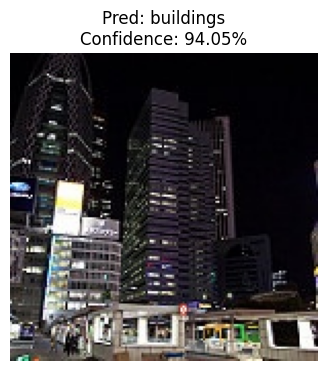

15663.jpg: buildings (94.05%)



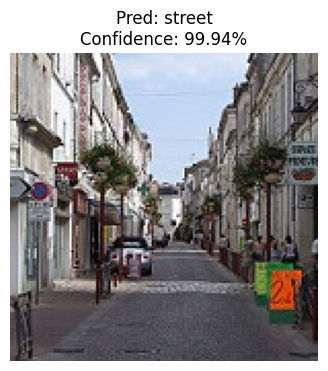

6539.jpg: street (99.94%)



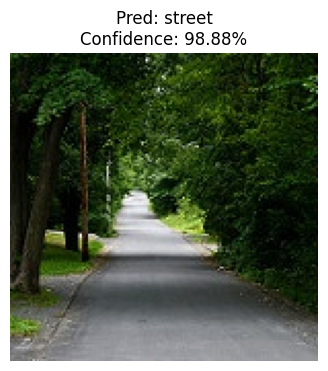

11105.jpg: street (98.88%)



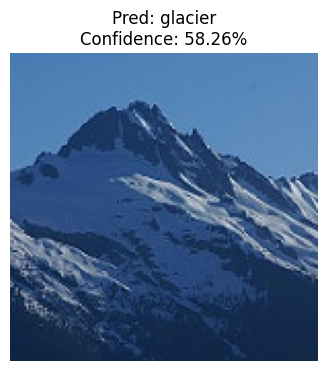

7938.jpg: glacier (58.26%)



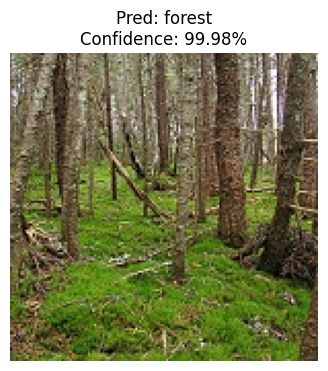

2117.jpg: forest (99.98%)



In [106]:
pred_image_dir = PRED_PATH / "seg_pred" if (PRED_PATH / "seg_pred").exists() else PRED_PATH

pred_image_files = [
    f for f in pred_image_dir.iterdir()
    if f.suffix.lower() in {".jpg", ".jpeg", ".png"}
]

print("Available prediction images:", len(pred_image_files))

sample_pred_files = random.sample(pred_image_files, 5)

for filepath in sample_pred_files:
    predicted_class, confidence, probs = predict_image(
        filepath,
        model=transfer_model,      # using the fine-tuned model, per Step 11's production choice
        img_size=TL_IMG_SIZE,
        class_names=class_names,
        rescale=False              # matches transfer model's raw 0-255 training input
    )
    print(f"{filepath.name}: {predicted_class} ({confidence:.2%})\n")